In [1]:
import os
import sys
import inspect

# Insert modules directory, TODO create setup.py file
currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
reports_dir = os.path.dirname(currentdir)
project_home_dir = os.path.dirname(reports_dir)
sys.path.insert(0, f"{project_home_dir}/qcnn") 

In [2]:
import numpy as np
import pandas as pd
from joblib import dump, load
from collections import namedtuple
from IPython.display import display
from pprint import pprint
from circuit_presets import get_wire_combos
from reporting_functions import (
    get_file_content,
    confusion_matrix_stats,
    get_result_table,
    get_result_table_target_pairs,
    gather_results_0_12,
    get_experiment_config,
    get_model_names,
    plot_loss
)
path_experiments = f"{project_home_dir}/experiments"

### Experiment 0 
___
First experiment, testing out all circuit and encoding combinations for (pop, classical) target pair
 - **Encoding**: *
 - **Circuit**: *
 - **Target Pair**: (Pop, Classical)
 - **Scaling**: minmax(0, 1) / standardised
 - **Feature Selection**: pca
 

embedding_type,Amplitude_Hybrid2_1,Amplitude_Hybrid2_2,Amplitude_Hybrid2_3,Amplitude_Hybrid2_4,Amplitude_Hybrid4_1,Amplitude_Hybrid4_2,Amplitude_Hybrid4_3,Amplitude_Hybrid4_4,Angle,Angular_Hybrid2_1,Angular_Hybrid2_2,Angular_Hybrid2_3,Angular_Hybrid2_4,Angular_Hybrid4_1,Angular_Hybrid4_2,Angular_Hybrid4_3,Angular_Hybrid4_4,circuit Average
circuit,,,,,,,,,,,,,,,,,,
U_13,0.550000,0.566667,0.483333,0.566667,0.583333,0.550000,0.433333,0.483333,1.000000,0.950000,0.983333,0.966667,1.000000,0.983333,1.000000,0.983333,0.966667,0.767647
U_14,0.533333,0.550000,0.616667,0.600000,0.550000,0.533333,0.516667,0.600000,0.983333,0.966667,0.966667,0.983333,0.966667,0.966667,0.950000,0.983333,0.983333,0.779412
U_15,0.583333,0.616667,0.683333,0.600000,0.633333,0.550000,0.500000,0.500000,1.000000,0.983333,0.983333,0.983333,0.966667,0.983333,0.983333,0.983333,1.000000,0.796078
U_5,0.616667,0.650000,0.566667,0.583333,0.450000,0.616667,0.400000,0.516667,1.000000,1.000000,0.966667,0.983333,0.966667,0.950000,0.983333,0.983333,0.983333,0.777451
U_6,0.666667,0.600000,0.550000,0.666667,0.700000,0.716667,0.583333,0.650000,0.983333,1.000000,0.983333,0.983333,1.000000,0.950000,0.983333,1.000000,0.983333,0.823529
U_9,0.666667,0.500000,0.550000,0.516667,0.550000,0.466667,0.600000,0.483333,0.983333,0.966667,0.983333,0.966667,1.000000,1.000000,0.983333,0.983333,0.983333,0.775490
U_SO4,0.683333,0.700000,0.633333,0.733333,0.416667,0.550000,0.550000,0.533333,0.983333,0.966667,0.950000,0.983333,0.983333,0.950000,0.966667,0.983333,0.983333,0.797059
U_SU4,0.550000,0.583333,0.583333,0.566667,0.616667,0.533333,0.533333,0.533333,1.000000,0.983333,0.983333,0.983333,0.983333,0.983333,0.983333,1.000000,1.000000,0.788235
U_TTN,0.583333,0.450000,0.516667,0.616667,0.516667,0.583333,0.433333,0.516667,0.950000,0.983333,0.966667,0.950000,0.983333,0.983333,1.000000,0.983333,0.966667,0.763725


None

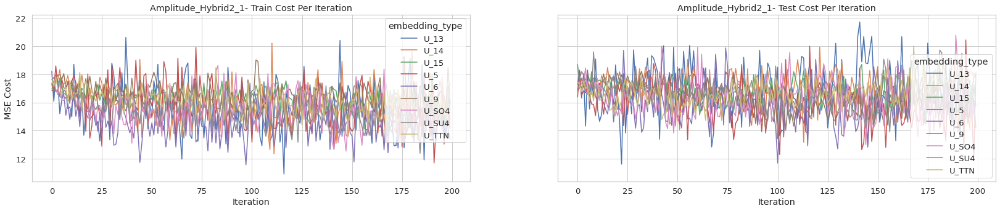

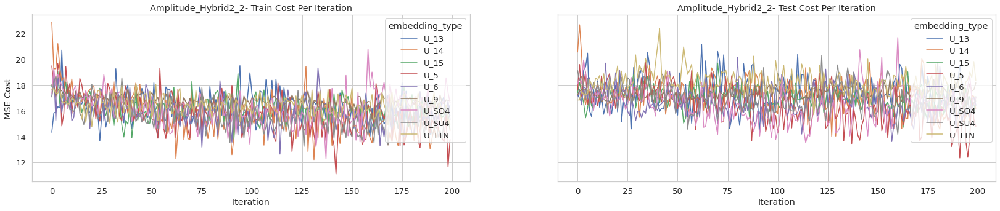

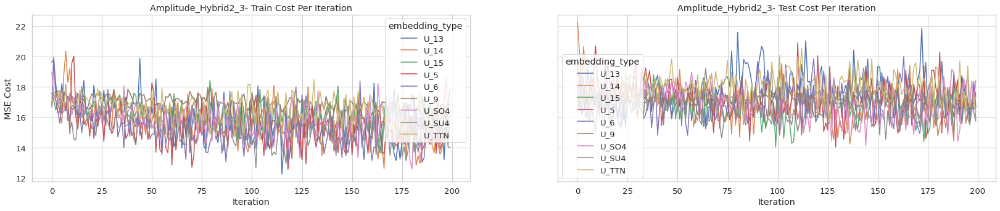

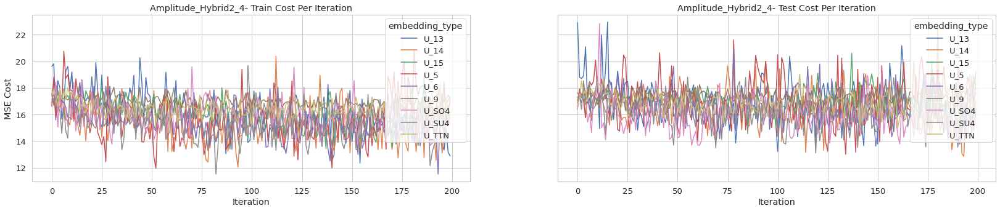

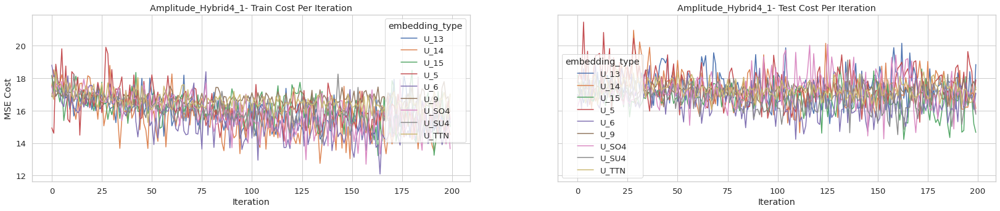

...

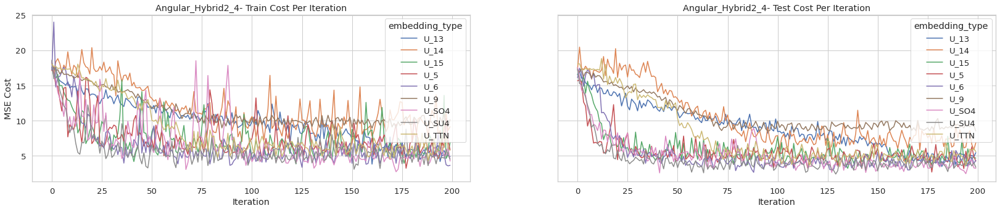

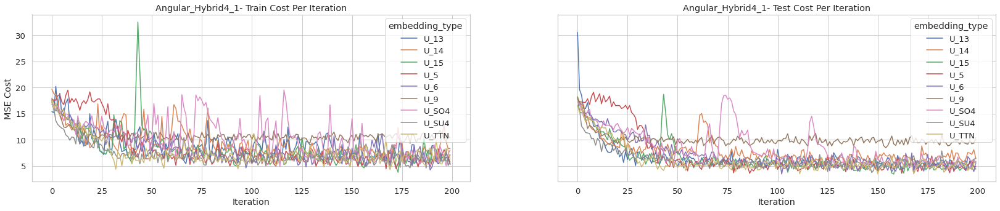

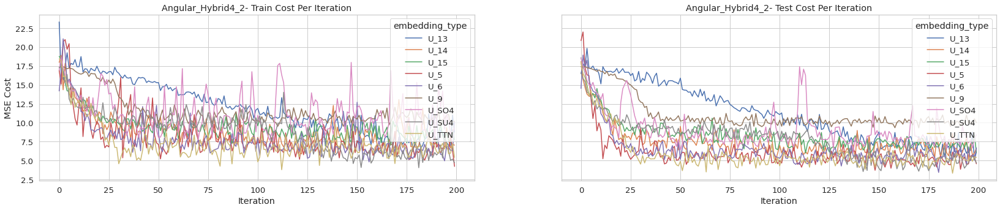

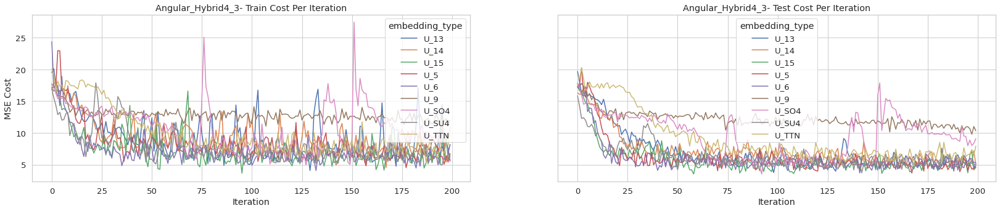

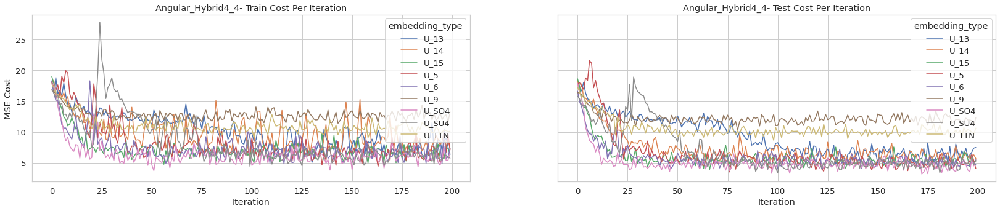

In [6]:
exp_id = 0
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Amplitude_Hybrid* doesn't fit, while all angular methods are able to train
 - Angular_Hybrid2_3, Angular_Hybrid4_1 had consistent test performance on all circuits
 - Angle had good performance except for U_9 and U_TTN
 - Accuracy on pop classical is quite high (easily seperable), to measure encoding methods other target pairs needs to be tested

### Experiment 1
___
Scaling during pre-processing, U_5 circuit with Angle and Amplitude_Hybrid4_4 encoding.
 - **Encoding**: Angle, Amplitude_Hybrid4_4
 - **Circuit**: U_5
 - **Target Pair**: (Pop, Classical)
 - **Scaling**: minmax(-1, 1) / standardised
 - **Feature Selection**: pca
 

embedding_type,Amplitude_Hybrid4_4,Angle,circuit Average
circuit,,,
U_5,0.616667,0.966667,0.791667
embedding_type Average,0.616667,0.966667,0.791667


None

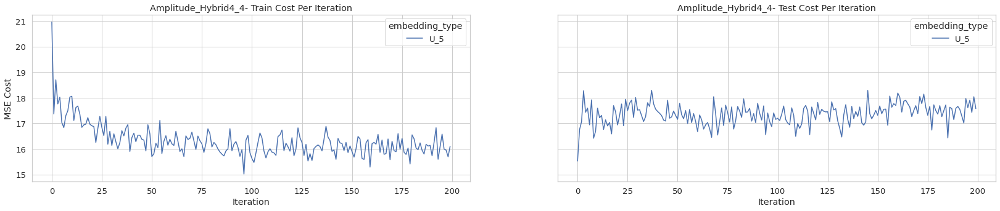

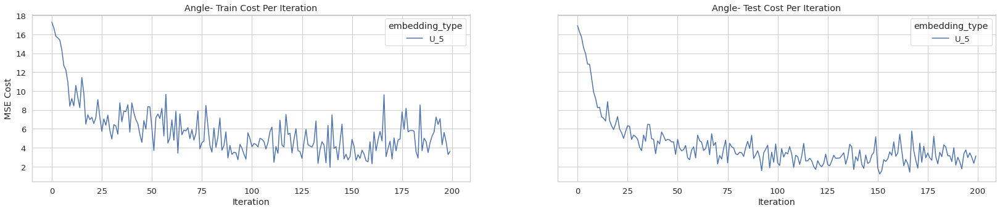

In [9]:
exp_id = 1
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Amplitude_Hybrid4_4 train cost decreases a little but test increases (might be over fitting but the train cost doesn't decrease that much). 

### Experiment 2
___
Standard Scaling (guassian normalization) during pre-processing, U_5 circuit with Angle and Amplitude_Hybrid4_4 encoding.
 - **Encoding**: Angle, Amplitude_Hybrid4_4
 - **Circuit**: U_5
 - **Target Pair**: (Pop, Classical)
 - **Scaling**: standardised
 - **Feature Selection**: pca
 

embedding_type,Amplitude_Hybrid4_4,Angle,circuit Average
circuit,,,
U_5,0.616667,0.8,0.708333
embedding_type Average,0.616667,0.8,0.708333


None

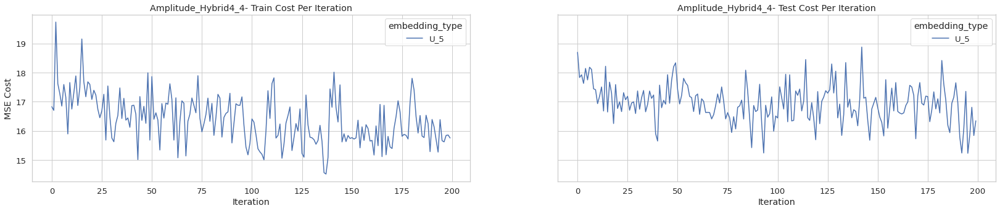

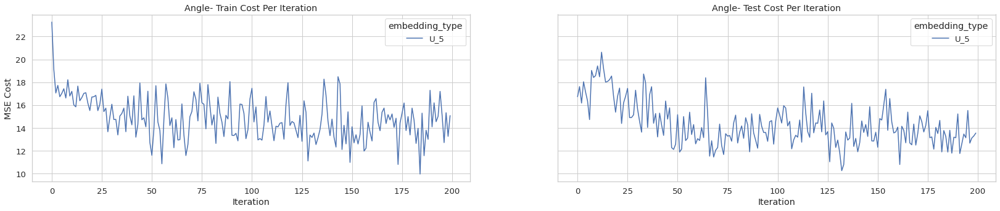

In [15]:
exp_id = 2
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Performance decreased, standardisation does not work well wit Angle+U_5 

### Experiment 3
___
No Scaling except for amplitude, U_5 circuit with Angle and Amplitude_Hybrid4_4 encoding.
 - **Encoding**: Angle, Amplitude_Hybrid4_4
 - **Circuit**: U_5
 - **Target Pair**: (Pop, Classical)
 - **Scaling**: None / standardised
 - **Feature Selection**: pca
 

embedding_type,Amplitude_Hybrid4_4,Angle,circuit Average
circuit,,,
U_5,0.666667,0.4,0.533333
embedding_type Average,0.666667,0.4,0.533333


None

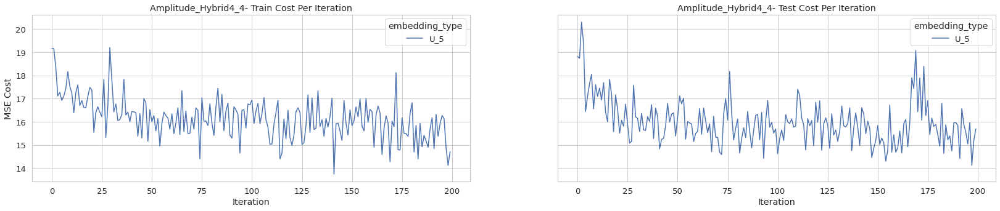

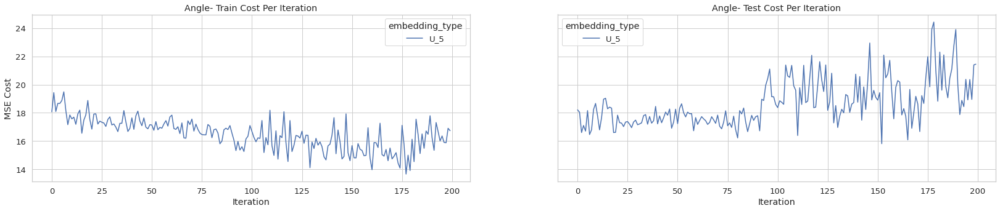

In [14]:
exp_id = 3
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Performance decreased, scaling is rquired for Angle+U_5 

### Experiment 4
___
Default scaling, U_5, U_TTN circuits with mplitude_Hybrid2_1, Amplitude_Hybrid4_4, Angle, Angular_Hybrid2_1 encodings.
 - **Encoding**: Amplitude_Hybrid2_1, Amplitude_Hybrid4_4, Angle, Angular_Hybrid2_1
 - **Circuit**: U_5, U_TTN
 - **Target Pair**: (Pop, Classical)
 - **Scaling**: minmax(0,1) / standardised
 - **Feature Selection**: pca
 

embedding_type,Amplitude_Hybrid2_1,Amplitude_Hybrid4_4,Angle,Angular_Hybrid2_1,circuit Average
circuit,,,,,
U_5,0.650000,0.466667,0.983333,1.000,0.775000
U_TTN,0.666667,0.550000,1.000000,0.950,0.791667
embedding_type Average,0.658333,0.508333,0.991667,0.975,0.783333


None

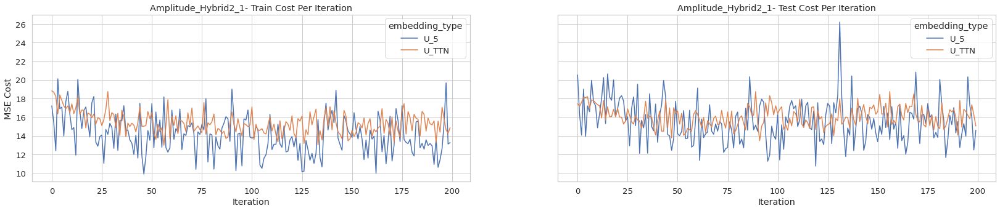

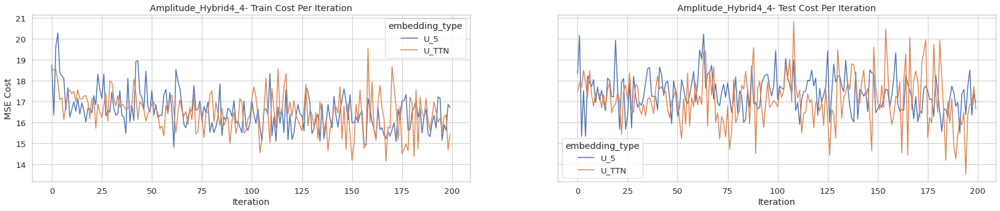

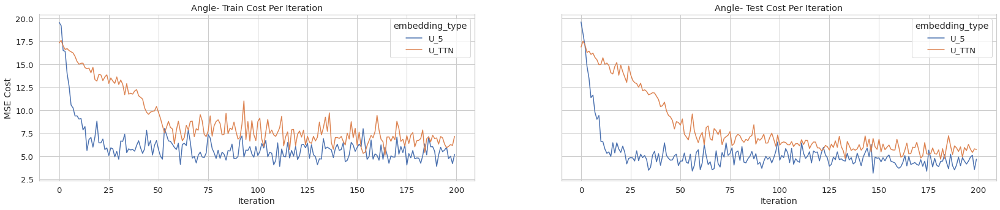

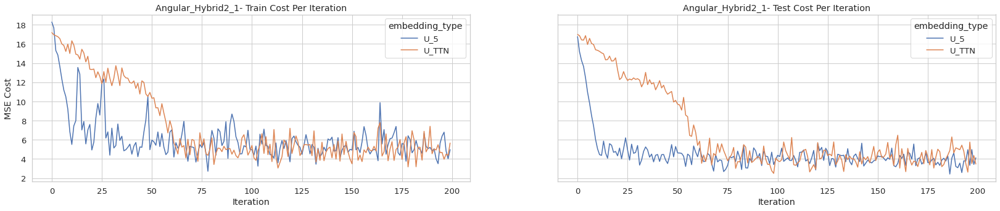

In [18]:
exp_id = 4
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Similar to experiment 1 Angular encoding works well
 - U_5 trains faster than U_TTN

### Experiment 5
___
Trying out a new target pair: Hiphop and Reggae
 - **Encoding**:Amplitude_Hybrid2_1, Amplitude_Hybrid4_4, Angle, Angular_Hybrid2_1
 - **Circuit**: U_5, U_TTN
 - **Target Pair**: (Hihop, Reggae)
 - **Scaling**: minmax(0,1) / standardised
 - **Feature Selection**: pca
 

embedding_type,Amplitude_Hybrid2_1,Amplitude_Hybrid4_4,Angle,Angular_Hybrid2_1,circuit Average
circuit,,,,,
U_5,0.650000,0.366667,0.766667,0.633333,0.604167
U_TTN,0.566667,0.466667,0.583333,0.533333,0.537500
embedding_type Average,0.608333,0.416667,0.675000,0.583333,0.570833


None

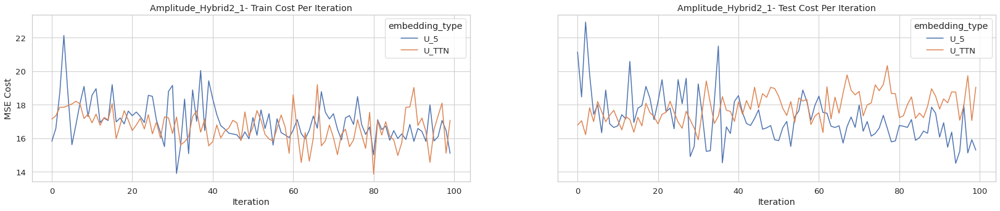

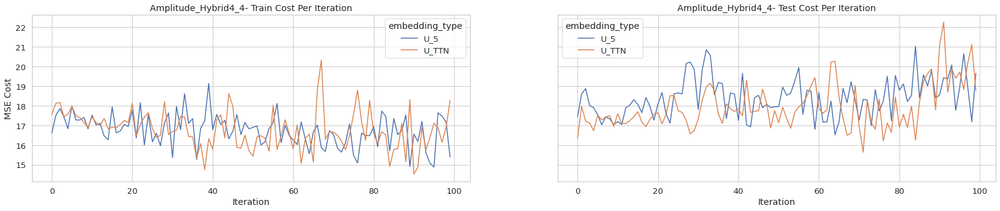

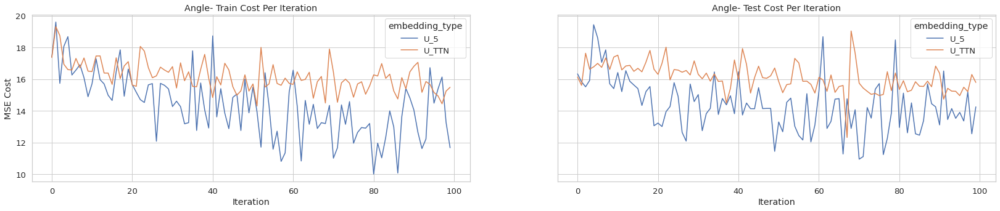

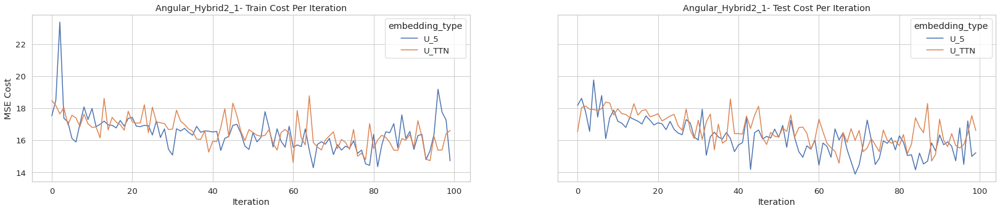

In [21]:
exp_id = 5
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Hiphop vs reggae much harder to model than pop vs classical
 - Angle + U_5 performed the best

### Experiment 6
___
Changed scaling to (0,pi). Using Angle encodings with U_5 and U_TTN.
 - **Encoding**: Angle, Angle_Compact, Angular_Hybrid2_1
 - **Circuit**: U_5, U_TTN
 - **Target Pair**: (hiphop, reggae)
 - **Scaling**: (0,pi)
 - **Feature Selection**: pca
 

/home/matt/dev/projects/quantum-cnn/qcnn/reporting_functions.py:72: RuntimeWarning: invalid value encountered in long_scalars
  precision = cf[1, 1] / sum(cf[:, 1])


embedding_type,Angle,Angle_Compact,Angular_Hybrid2_1,circuit Average
circuit,,,,
U_5,0.750000,0.516667,0.700000,0.655556
U_TTN,0.666667,0.483333,0.666667,0.605556
embedding_type Average,0.708333,0.500000,0.683333,0.630556


None

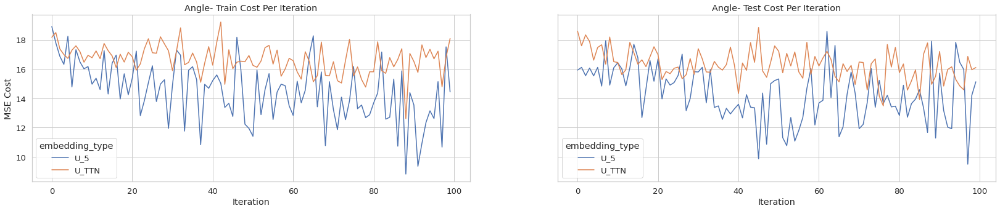

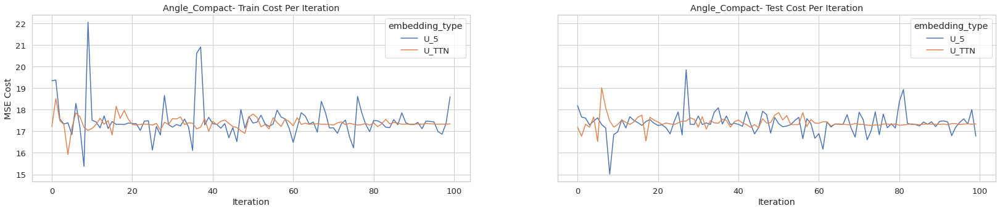

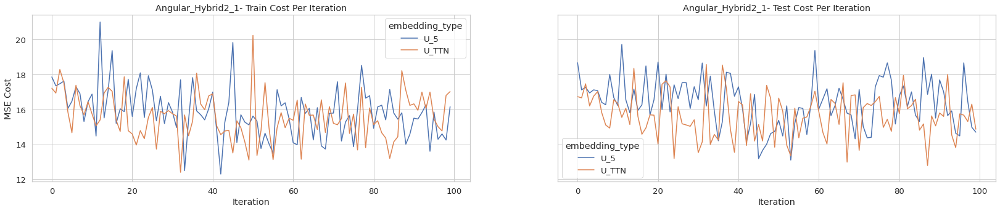

In [24]:
exp_id = 6
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Similar results to experiment 5, Angle performance slightly decreased but at this stage it was just one training run.
 - Encoding average for Angle increased, U_TTN performed better 58%->66% with this scaling. This might sugest the 0,pi range generalizes accros different problem domains better. To validate this variablity needs to be checked. TODO
 - It's interresting how Angle-Compact stabilizes (doesn't train but variability seems to decrease especially for U_5)

### Experiment 7
___
Changed scaling to (-pi,pi). Using Angle encodings with U_5 and U_TTN.
 - **Encoding**: Angle, Angle_Compact, Angular_Hybrid2_1
 - **Circuit**: U_5, U_TTN
 - **Target Pair**: (hiphop, reggae)
 - **Scaling**: minmax(-pi, pi)
 - **Feature Selection**: pca
 

/home/matt/dev/projects/quantum-cnn/qcnn/reporting_functions.py:72: RuntimeWarning: invalid value encountered in long_scalars
  precision = cf[1, 1] / sum(cf[:, 1])


embedding_type,Angle,Angle_Compact,Angular_Hybrid2_1,circuit Average
circuit,,,,
U_5,0.550,0.483333,0.566667,0.533333
U_TTN,0.600,0.516667,0.466667,0.527778
embedding_type Average,0.575,0.500000,0.516667,0.530556


None

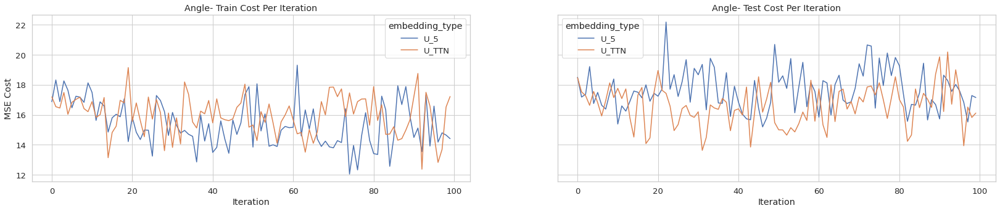

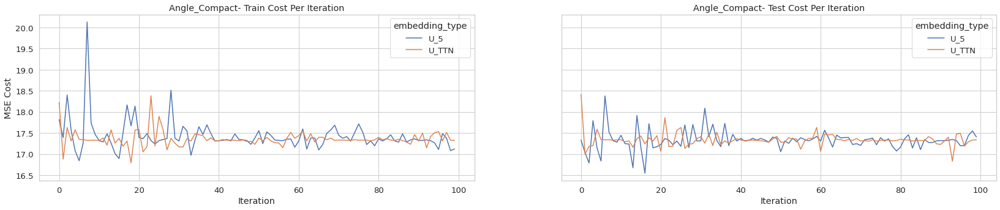

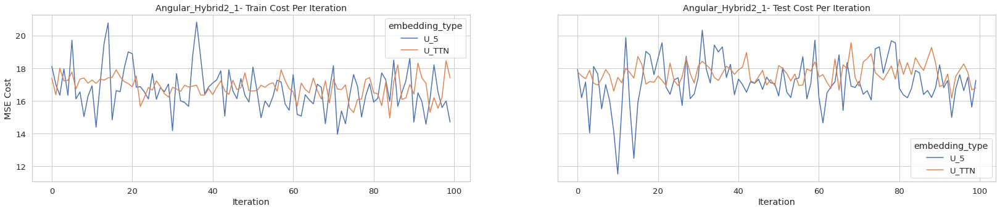

In [27]:
exp_id = 7
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Performance decreased overall, scaling Angle encodings between (-pi,pi) made it more difficult to train 

### Experiment 8
___
Changed scaling to (-2\*pi,2\*pi). Using Angle encodings with U_5 and U_TTN.
 - **Encoding**: Angle, Angle_Compact, Angular_Hybrid2_1
 - **Circuit**: U_5, U_TTN
 - **Target Pair**: (hiphop, reggae)
 - **Scaling**: minmax(-2\*pi, 2\*pi)
 - **Feature Selection**: pca
 

/home/matt/dev/projects/quantum-cnn/qcnn/reporting_functions.py:72: RuntimeWarning: invalid value encountered in long_scalars
  precision = cf[1, 1] / sum(cf[:, 1])


embedding_type,Angle,Angle_Compact,Angular_Hybrid2_1,circuit Average
circuit,,,,
U_5,0.650,0.483333,0.433333,0.522222
U_TTN,0.500,0.516667,0.483333,0.500000
embedding_type Average,0.575,0.500000,0.458333,0.511111


None

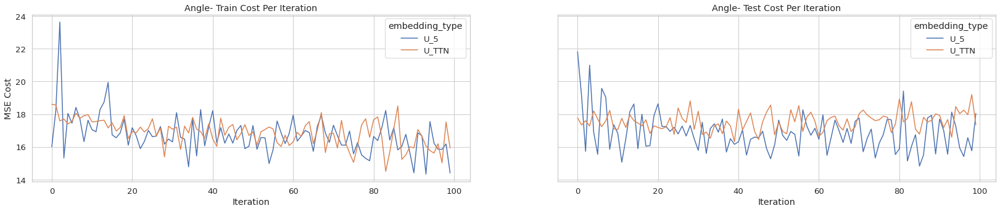

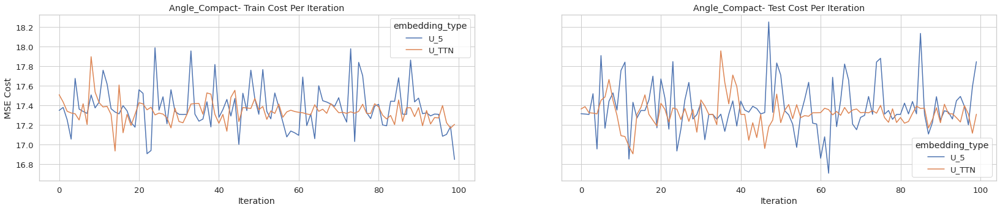

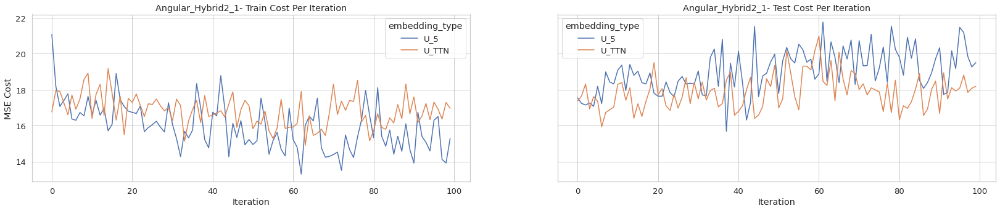

In [31]:
exp_id = 8
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "circuit"], figsize=(28, 5)))

#### Remarks

 - Performance decreased overall, scaling Angle encodings between (-2\*pi,2\*pi) made it more difficult to train 

### Experiment 9
___
Increased iterations (200), all circuits comparing Angle and Angular_Hybrid2_1 encodings (from exp 0 Angular_Hybrid2_1, Angular_Hybrid4_1 it would be good to test them aswell TODO)
 - **Encoding**: Angle, Angulare_Hybrid2_1
 - **Circuit**: *
 - **Target Pair**: (hiphop, reggae)
 - **Scaling**: minmax(0,pi)
 - **Feature Selection**: pca
 - **Iterations**: 200
 

embedding_type,Angle,Angular_Hybrid2_1,circuit Average
circuit,,,
U_13,0.633333,0.716667,0.675000
U_14,0.666667,0.633333,0.650000
U_15,0.633333,0.683333,0.658333
U_5,0.816667,0.700000,0.758333
U_6,0.800000,0.650000,0.725000
U_9,0.666667,0.500000,0.583333
U_SO4,0.766667,0.583333,0.675000
U_SU4,0.766667,0.650000,0.708333
U_TTN,0.616667,0.650000,0.633333


None

None

None

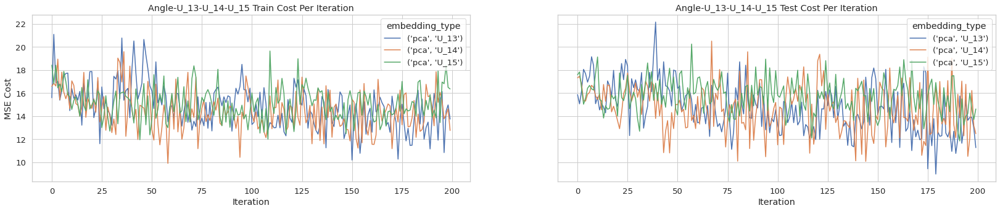

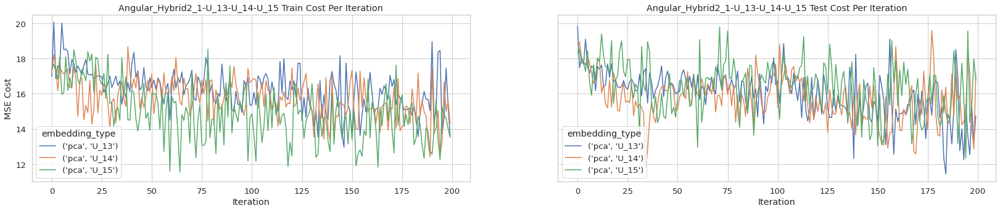

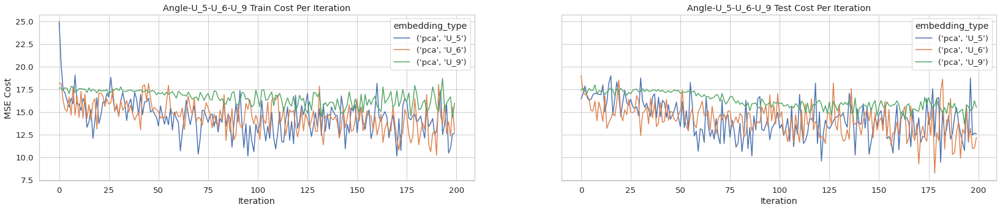

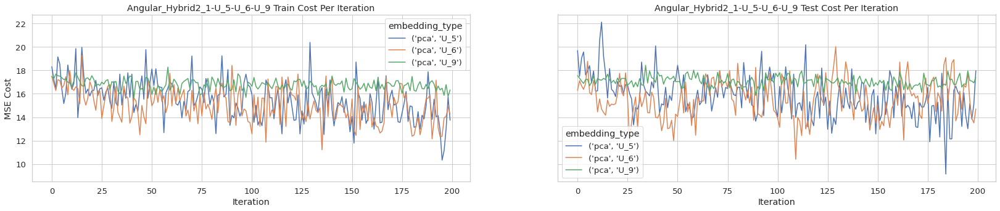

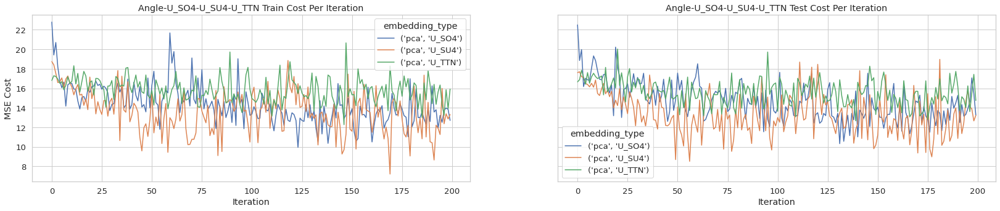

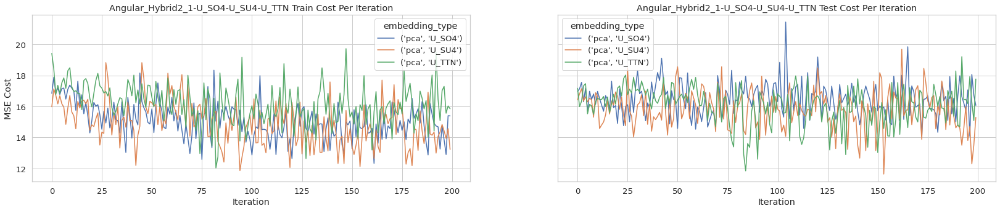

In [55]:
exp_id = 9
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_13","U_14","U_15"], figsize=(28, 5)))
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_5","U_6","U_9"], figsize=(28, 5)))
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_SO4","U_SU4","U_TTN"], figsize=(28, 5)))

#### Remarks

 - U_5, U_6, U_9 had the most stable performance (they are related TODO check how again)
 - Angle+U_5 had the highest accuracy again
 - U_9 didn't vary much at all
 
 - TODO test same experiment on Angular_Hybrid2_1, Angular_Hybrid4_1

### Experiment 10
___
All circuits comparing Amplitude_Hybrid2_1, Angle, Angular_Hybrid2_1 encodings
 - **Encoding**: Amplitude_Hybrid2_1, Angle, Angular_Hybrid2_1 
 - **Circuit**: *
 - **Target Pair**: (disco, jazz)
 - **Scaling**: minmax(0,pi)
 - **Feature Selection**: pca
 - **Iterations**: 100
 

embedding_type,Amplitude_Hybrid2_1,Angle,Angular_Hybrid2_1,circuit Average
circuit,,,,
U_13,0.583333,0.683333,0.650000,0.638889
U_14,0.633333,0.683333,0.600000,0.638889
U_15,0.566667,0.716667,0.783333,0.688889
U_5,0.600000,0.766667,0.750000,0.705556
U_6,0.583333,0.733333,0.583333,0.633333
U_9,0.633333,0.616667,0.600000,0.616667
U_SO4,0.450000,0.700000,0.800000,0.650000
U_SU4,0.566667,0.783333,0.750000,0.700000
U_TTN,0.566667,0.733333,0.583333,0.627778


None

None

None

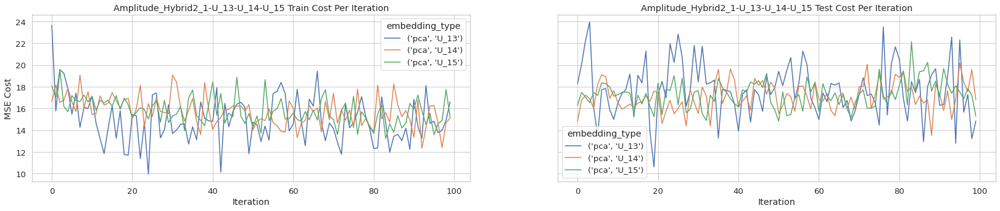

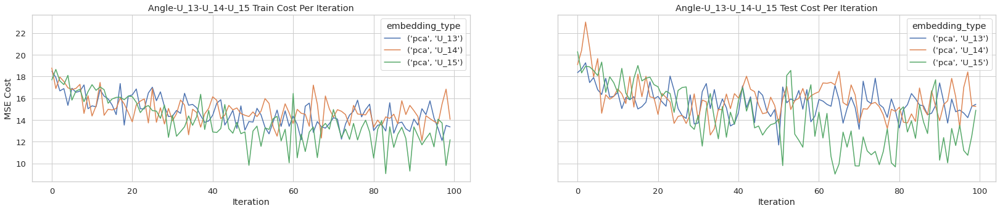

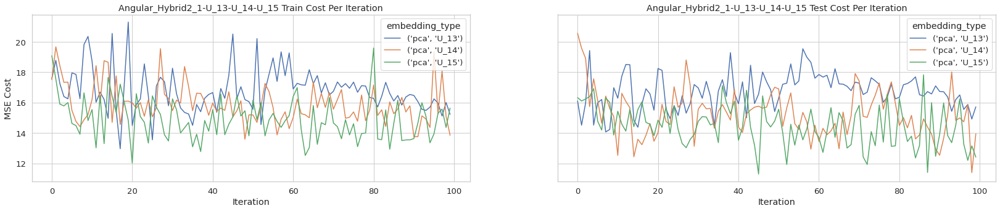

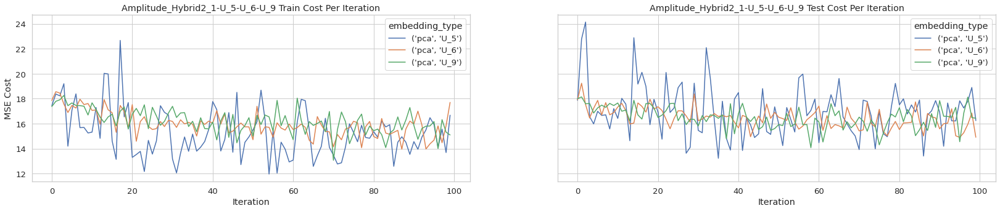

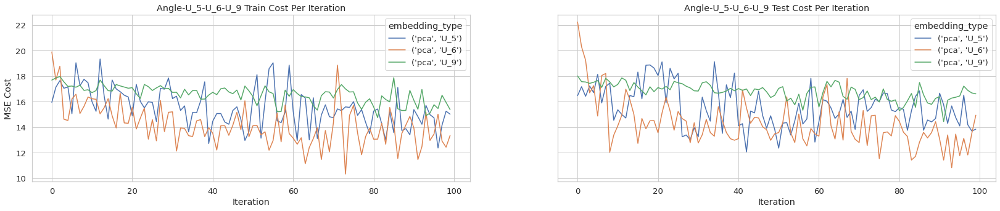

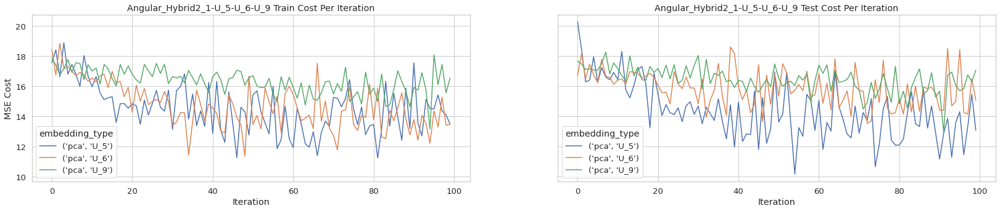

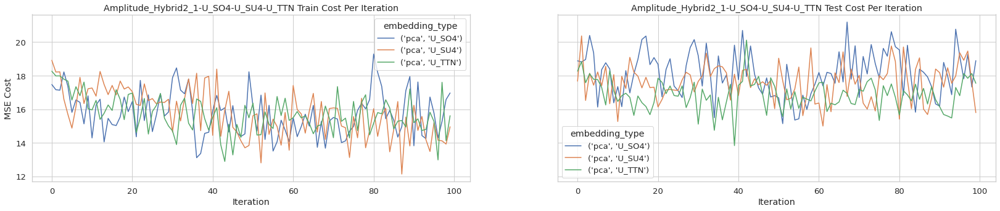

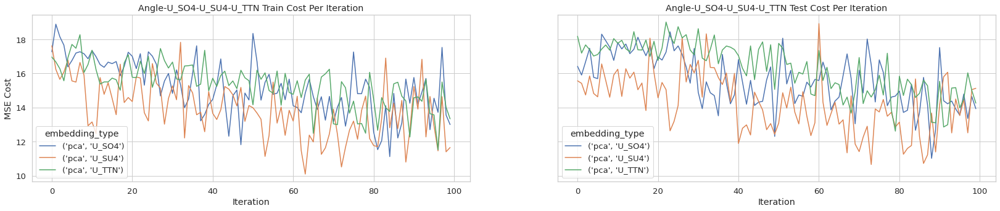

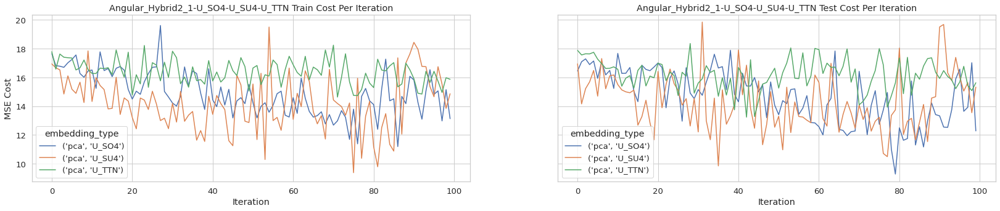

In [59]:
exp_id = 10
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_13","U_14","U_15"], figsize=(28, 5)))
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_5","U_6","U_9"], figsize=(28, 5)))
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_SO4","U_SU4","U_TTN"], figsize=(28, 5)))

#### Remarks

 - U_5, U_6, U_9 had the most stable performance again
 - Angular_Hybrid2_1+U_SO4 had the highest accuracy this time 80%
 - U_9 didn't vary much again
 - U_5 had the highest circuit average 0.705556
 - Angle had the highest encoding average 0.712963
 
 - Classical models had a easier time in training on disc, jazz
 
 - TODO test same experiment on Angular_Hybrid2_1, Angular_Hybrid4_1

In [ ]:
(logistic_regression, pca, minmax)       0.940299
(logistic_regression, pca, standard)     0.940299
(logistic_regression, tree, minmax)      0.950249
(logistic_regression, tree, standard)    0.955224
(svm, pca, minmax)                       0.955224
(svm, pca, standard)                     0.940299
(svm, tree, minmax)                      0.970149
(svm, tree, standard)                    0.970149
selection_method Average                 0.952736

### Experiment 11
___
Metal and Rock.All circuits comparing Amplitude_Hybrid2_1, Angle, Angular_Hybrid2_1 encodings
 - **Encoding**: Amplitude_Hybrid2_1, Angle, Angular_Hybrid2_1 
 - **Circuit**: *
 - **Target Pair**: (metal, rock)
 - **Scaling**: minmax(0,pi)
 - **Feature Selection**: pca
 - **Iterations**: 100
 

embedding_type,Amplitude_Hybrid2_1,Angle,Angular_Hybrid2_1,circuit Average
circuit,,,,
U_13,0.516667,0.666667,0.500000,0.561111
U_14,0.566667,0.666667,0.483333,0.572222
U_15,0.550000,0.733333,0.650000,0.644444
U_5,0.516667,0.700000,0.683333,0.633333
U_6,0.533333,0.666667,0.666667,0.622222
U_9,0.550000,0.583333,0.616667,0.583333
U_SO4,0.533333,0.700000,0.700000,0.644444
U_SU4,0.583333,0.700000,0.616667,0.633333
U_TTN,0.550000,0.616667,0.516667,0.561111


None

None

None

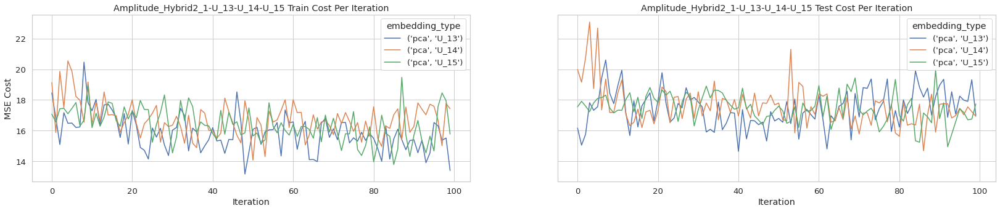

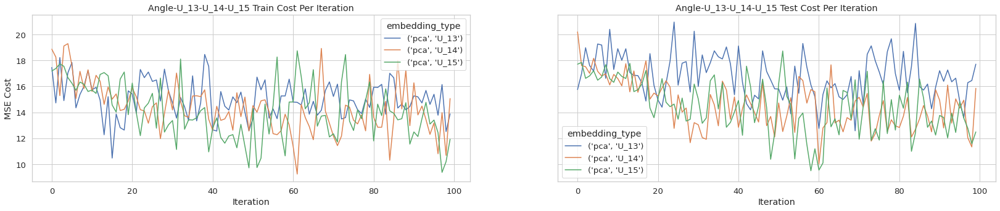

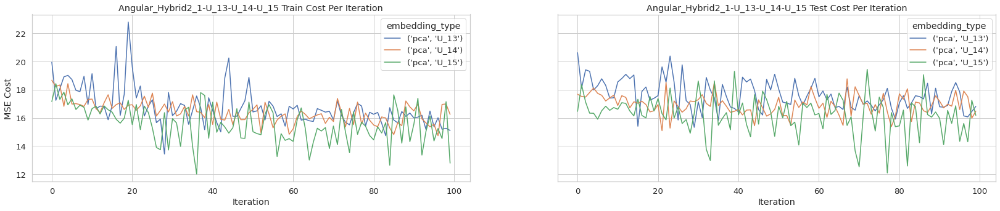

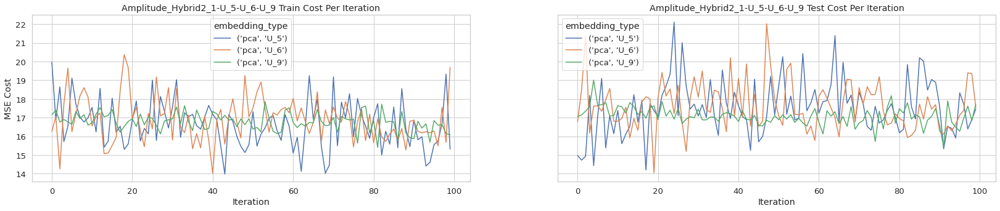

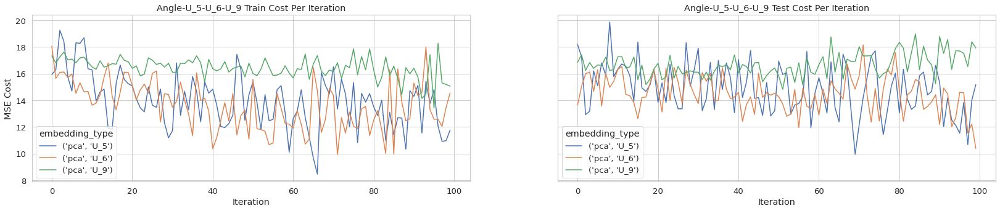

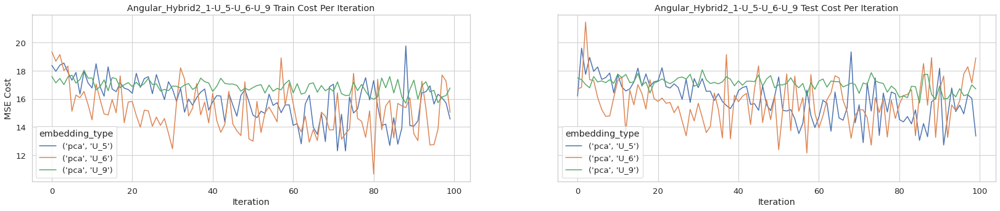

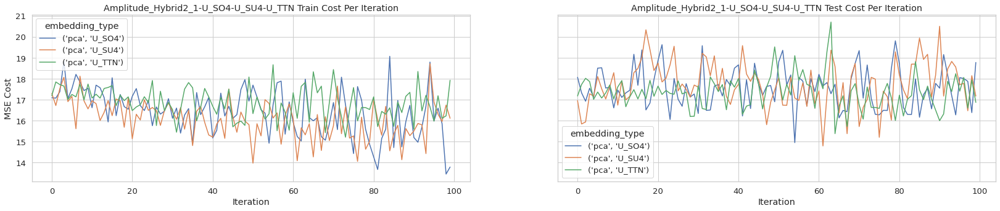

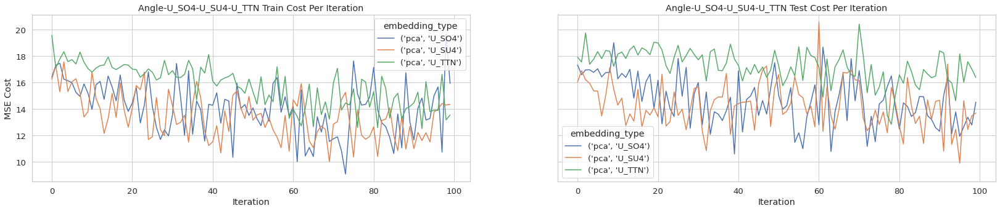

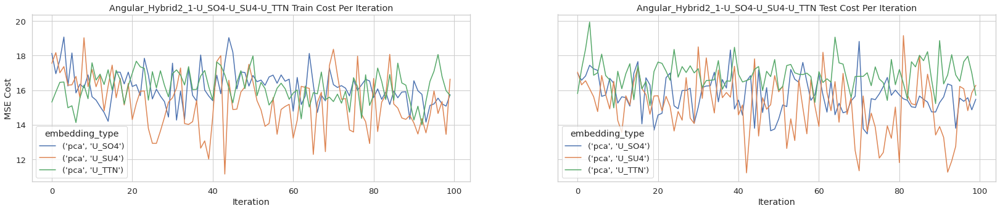

In [62]:
exp_id = 11
result_data = gather_results_0_12(exp_id, path_experiments=path_experiments)
# display(get_experiment_config(path_experiments, exp_id))
# display(
#     get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")
# )
display(
    get_result_table(
        result_data,
        ["circuit", "embedding_type"],
        "accuracy",
    )
)
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_13","U_14","U_15"], figsize=(28, 5)))
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_5","U_6","U_9"], figsize=(28, 5)))
display(plot_loss(result_data, ["embedding_type", "selection_method", "circuit"], group_filter=["U_SO4","U_SU4","U_TTN"], figsize=(28, 5)))

#### Remarks

 - Metal + Rock is hard to distinguish
 - Angle+U_15 had the highest accuracy this time 0.733333
 - U_SO4 and U_15  had the highest circuit average 0.644444
 - Angle had the highest encoding average 0.670370
 - U_9 + Angular Hybrid didn't vary much
 - Classical models had a easier time in training on disc, jazz
 
 - TODO test same experiment on Angular_Hybrid2_1, Angular_Hybrid4_1

In [ ]:
(logistic_regression, pca, minmax)       0.815385
(logistic_regression, pca, standard)     0.815385
(logistic_regression, tree, minmax)      0.856410
(logistic_regression, tree, standard)    0.861538
(svm, pca, minmax)                       0.800000
(svm, pca, standard)                     0.830769
(svm, tree, minmax)                      0.861538
(svm, tree, standard)                    0.861538
selection_method Average                 0.837821